# NDVI estimation

In [1]:
### Imports
from functions import *
import utils
import vistools

import numpy as np
import matplotlib.pyplot as plt
import rasterio
import tsd
from IPython.display import display, Image
from urllib import parse
from keras.utils import to_categorical
import sys, os
from math import ceil
from itertools import product
import glob
import time
import signal

from keras.models import *
from keras.layers import *
from keras.optimizers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler
from keras import backend as keras
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPool2D

Using TensorFlow backend.


## Data extraction

In [2]:
### Interface to select the AOIs
m = vistools.clickablemap(zoom=13)
all_aois = []
display(m)

Map(basemap={'url': 'https://{s}.tile.openstreetmap.org/{z}/{x}/{y}.png', 'max_zoom': 19, 'attribution': 'Map …

In [ ]:
my_satellite = 'Sentinel-2'
basename = 'veget'
dataset_name = 'dataset'

### create the dataset if it does not exist
if not dataset_name in os.listdir():
    os.mkdir(dataset_name)

### Create all AoIs
x,y = 1e-1, 1e-1
for raw_aoi in m.AOIs:
    try:
        aoi = generate_aoi(raw_aoi,x,y)
    except:
        aoi = {'type': 'Polygon', 'coordinates': [[[-122.410056, 37.77979], [-122.410056, 37.798578],
                        [-122.383276, 37.798578], [-122.383276, 37.77979]]]}
    all_aois.append(aoi)

### Fetch the images
size = (64,64)
for i,aoi in enumerate(all_aois):
    print(i,end='\r')
    try:
        to_save_train += generate_database(basename, aoi, size = size, max_cloud_cover = 10, nb_images = 1)
    except TypeError:
        print(f'aoi: {i} did not work')

### Save data
indexes = [int(name[5:-4]) for name in os.listdir(dataset_name) if 'image' in name]
new_index = min([x for x in range(10000) if not x in indexes])
for i,x in enumerate(to_save_train):
    np.savez(f'{dataset_name}/image{i+new_index}.npz', feat_boa=x['feat_boa'], feat_toa=x['feat_toa'],ndvi=x['NDVI'],ndwi=x['NDWI'])

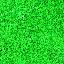

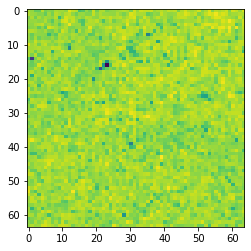

In [3]:
dataset_name = 'dataset'

### Import the data
indexes = [int(name[5:-4]) for name in os.listdir(dataset_name) if 'image' in name]
all_images = ['image'+str(i)+'.npz' for i in indexes]
train = [np.load(f'{dataset_name}/{x}') for x in all_images]

### Example of display
index = 700
display_color(train[index]['feat_boa'])
plt.imshow(train[index]['ndvi'])

## Model for NDVI

In [4]:
### Create the dataset
data = {'features':np.array([img['feat_toa']/256 for img in train]),
        'target':np.array([img['ndvi'][:,:,np.newaxis] for img in train])}

### split in / out of sample
N = len(data['features'])
train_size = 0.8
is_rows = np.random.choice(list(range(N)),int(train_size*N),replace = False)
os_rows = np.setdiff1d(list(range(N)),is_rows)

in_sample = {'features':data['features'][is_rows],'target':data['target'][is_rows]}
out_sample = {'features':data['features'][os_rows],'target':data['target'][os_rows]}

ndvi_model = load_model('ndvi_model')
# ndvi_model.fit(in_sample['features'],in_sample['target'],validation_data=(out_sample['features'],out_sample['target']),epochs=1)
# ndvi_model.save('ndvi_model')

In [5]:
print("(model's performance, ToA NDVI performance)")
print(model_score(ndvi_model,out_sample['features'],out_sample['target'],index_func = NDVI))

(model's performance, ToA NDVI performance)
(0.0013804870861068327, 0.007600717122159355)


In [6]:
sg_ts = np.load('sg/ts.npy', allow_pickle = True)
features = np.array([x['feat_toa'] for x in sg_ts])
target = np.array([x['NDVI'][:,:,np.newaxis] for x in sg_ts])
("(model's performance on the Singapore time series, ToA NDVI performance)")
print(model_score(ndvi_model,features/256,target,index_func=NDVI))
sg_ndvi = apply_model(features/256,ndvi_model)

(0.004152899467523745, 0.009011197952348119)


0
Real image


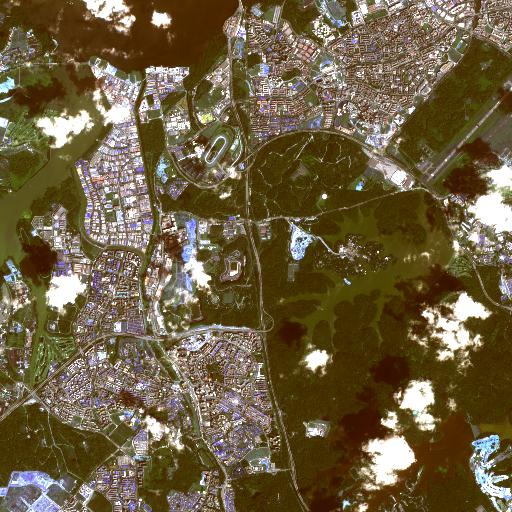

Real NDVI


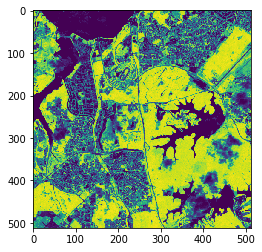

Model prediction


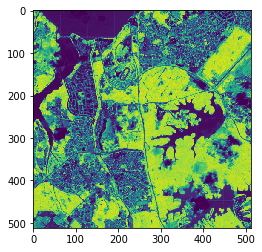

ToA NDVI


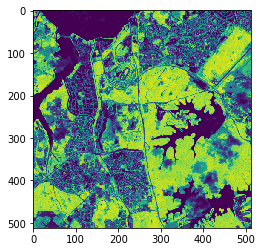

1
Real image


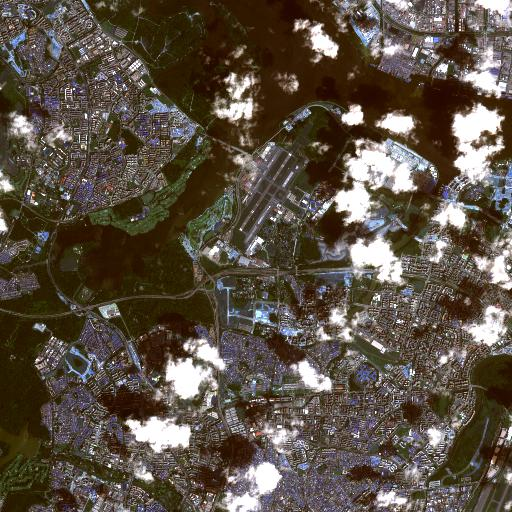

Real NDVI


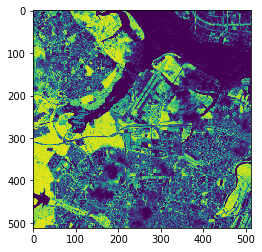

Model prediction


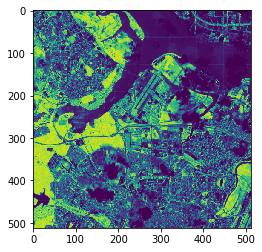

ToA NDVI


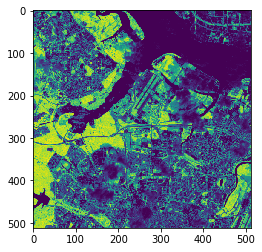

2
Real image


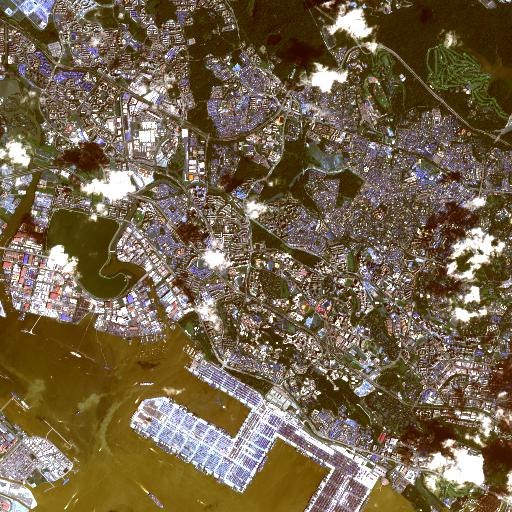

Real NDVI


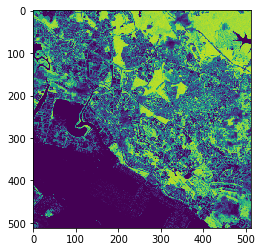

Model prediction


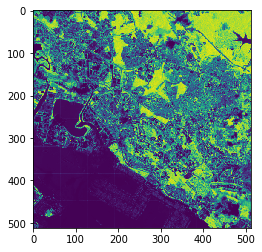

ToA NDVI


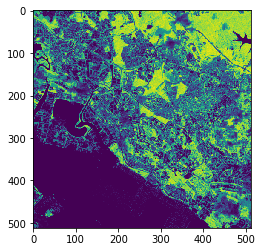

3
Real image


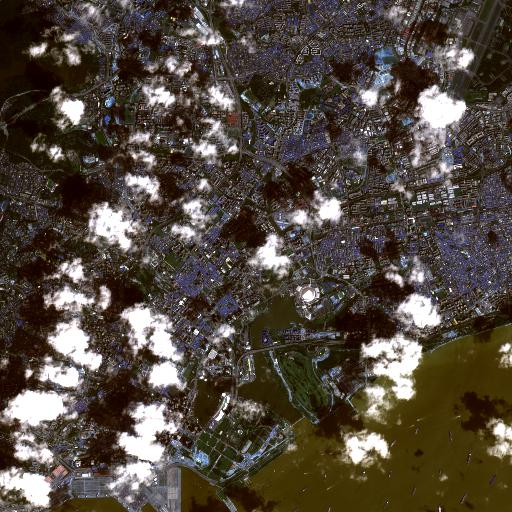

Real NDVI


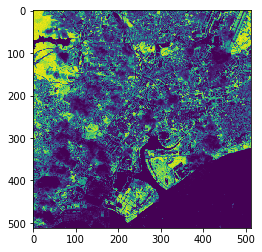

Model prediction


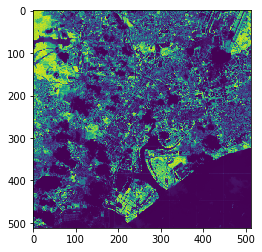

ToA NDVI


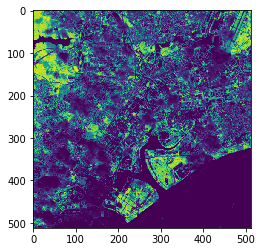

4
Real image


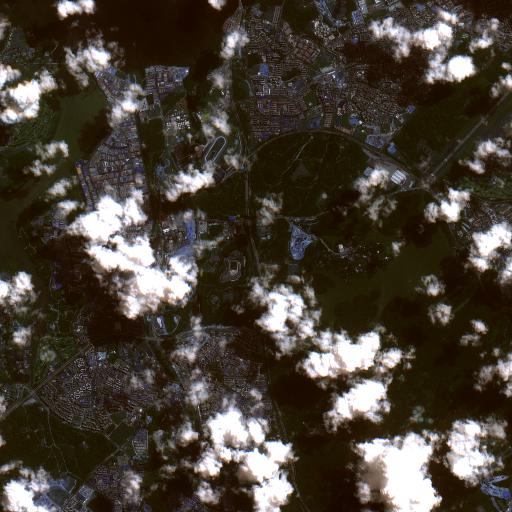

Real NDVI


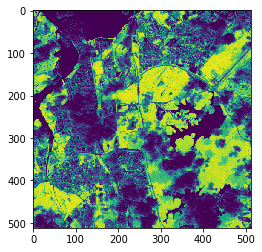

Model prediction


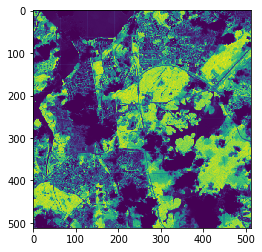

ToA NDVI


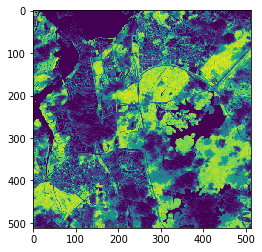

5
Real image


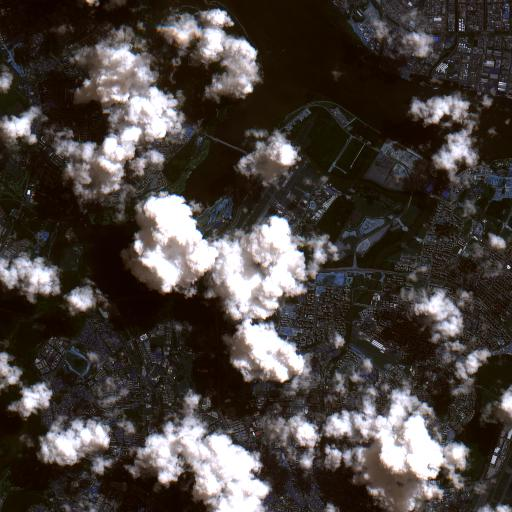

Real NDVI


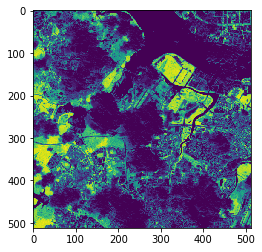

Model prediction


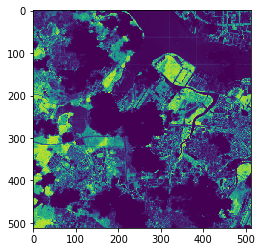

ToA NDVI


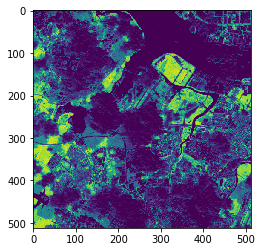

6
Real image


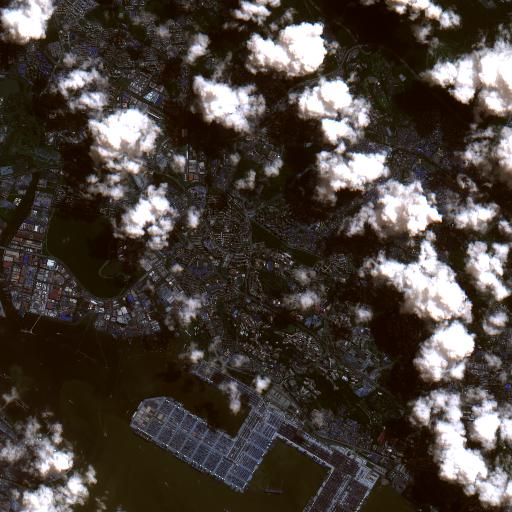

Real NDVI


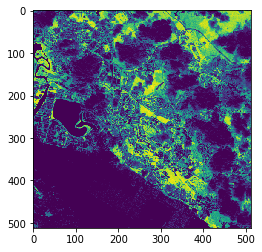

Model prediction


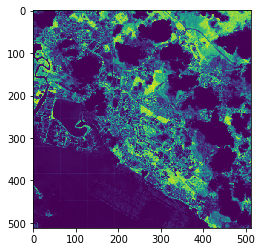

ToA NDVI


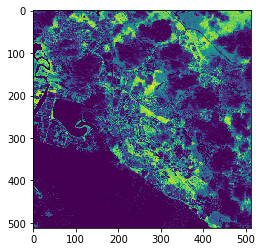

7
Real image


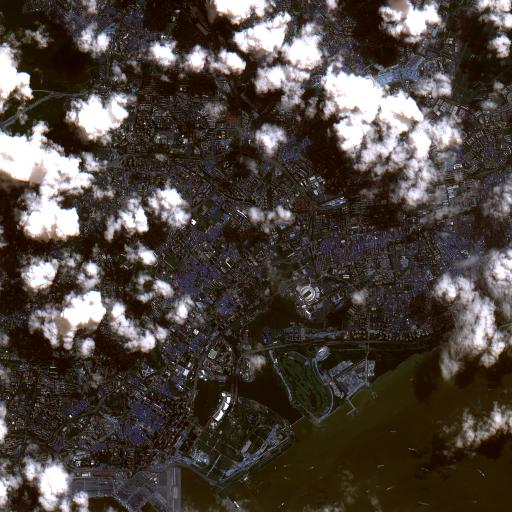

Real NDVI


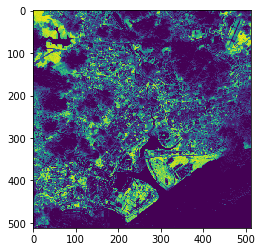

Model prediction


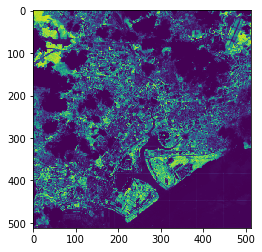

ToA NDVI


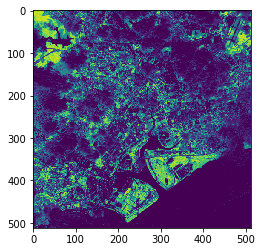

8
Real image


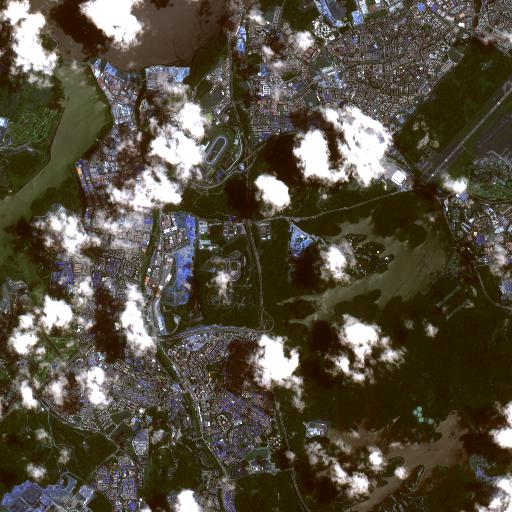

Real NDVI


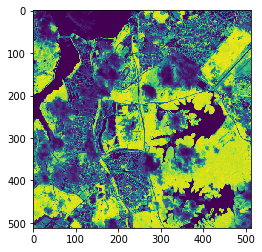

Model prediction


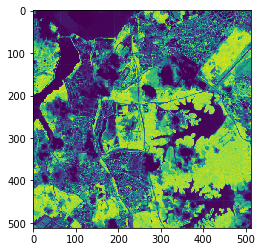

ToA NDVI


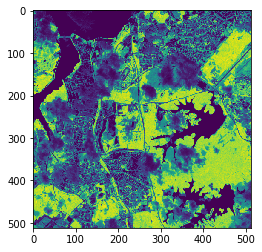

9
Real image


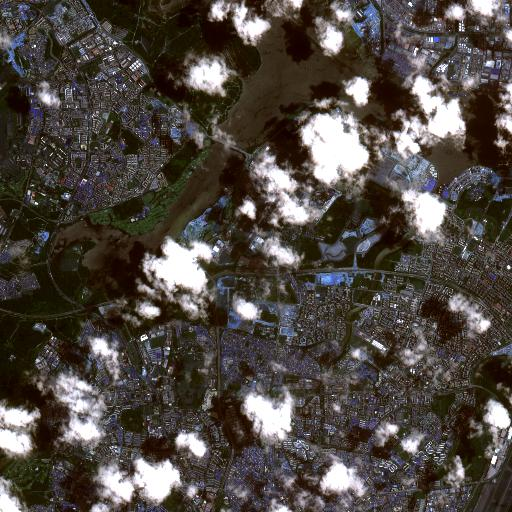

Real NDVI


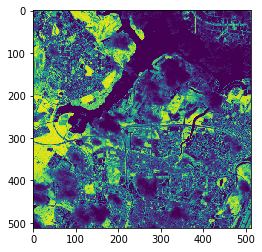

Model prediction


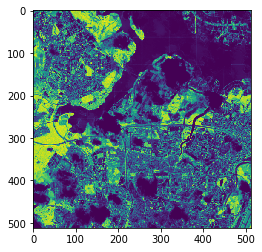

ToA NDVI


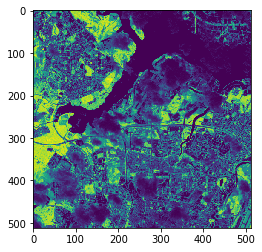

10
Real image


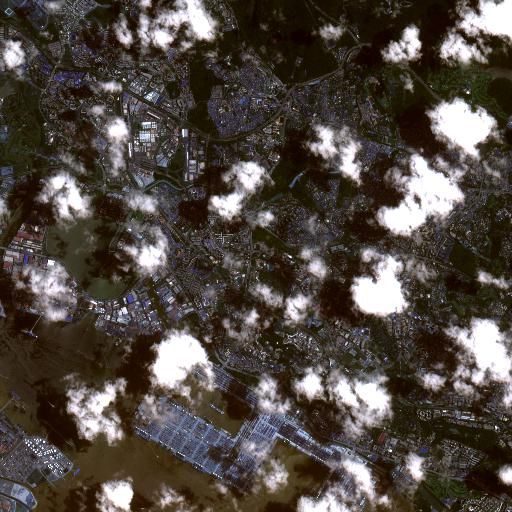

Real NDVI


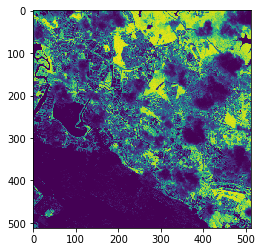

Model prediction


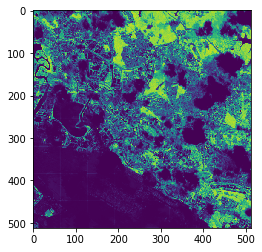

ToA NDVI


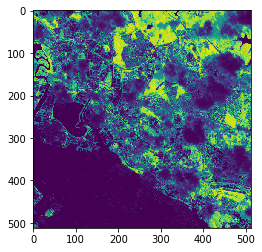

11
Real image


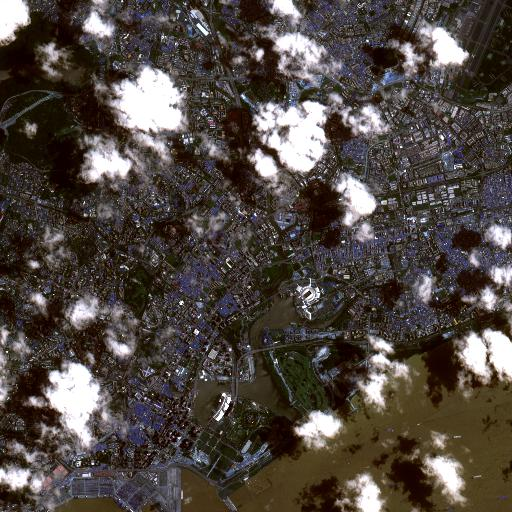

Real NDVI


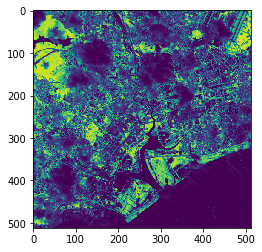

Model prediction


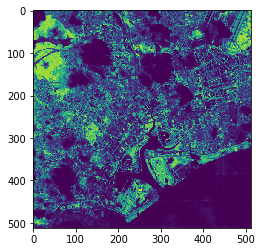

ToA NDVI


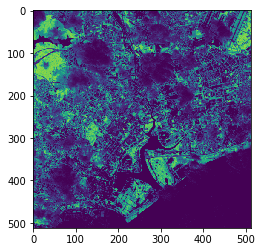

12
Real image


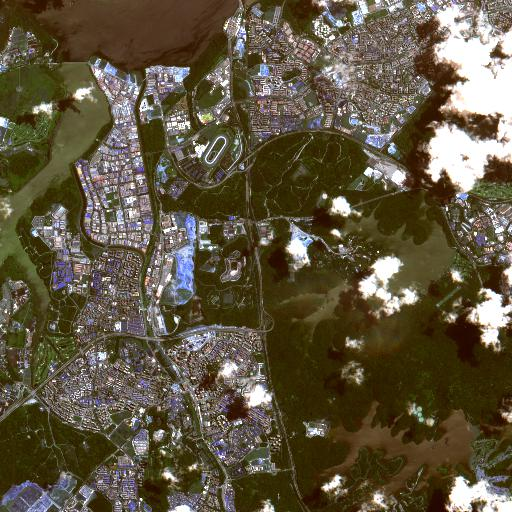

Real NDVI


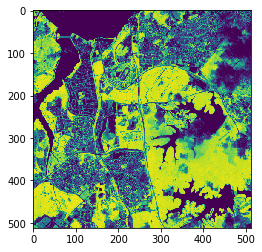

Model prediction


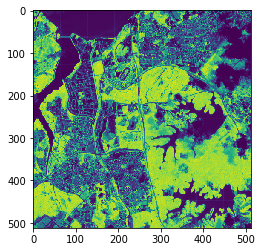

ToA NDVI


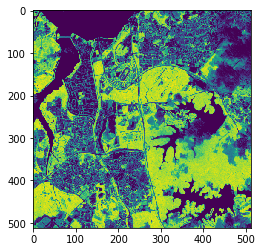

13
Real image


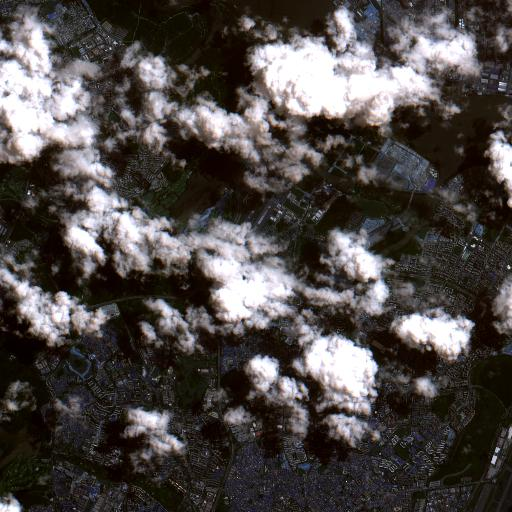

Real NDVI


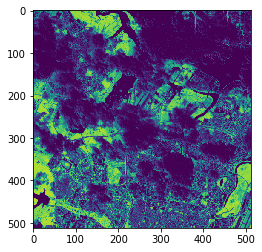

Model prediction


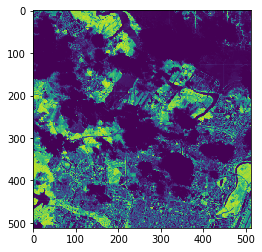

ToA NDVI


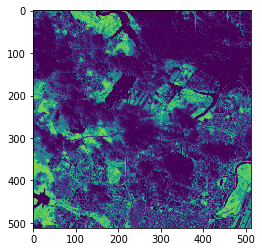

14
Real image


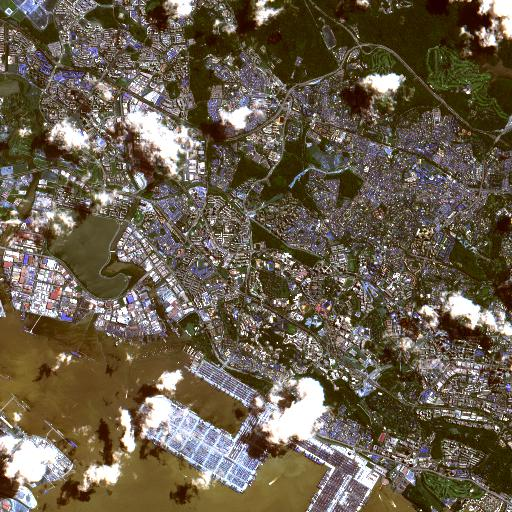

Real NDVI


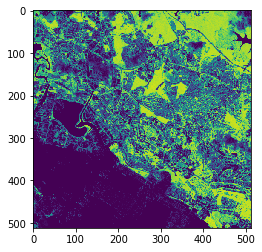

Model prediction


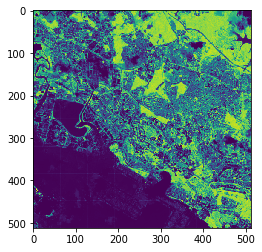

ToA NDVI


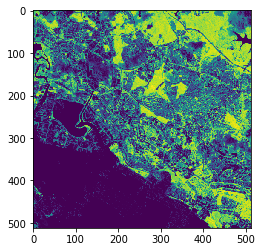

15
Real image


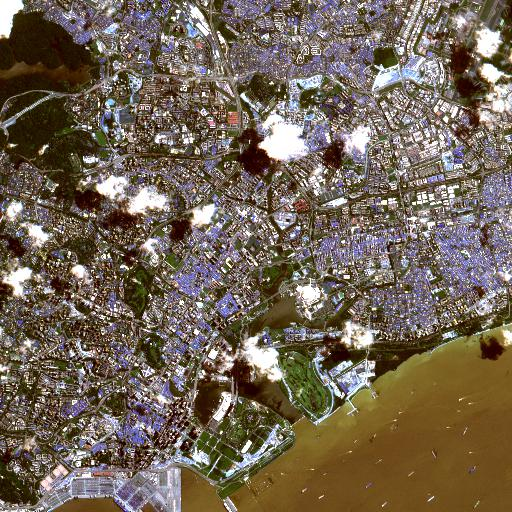

Real NDVI


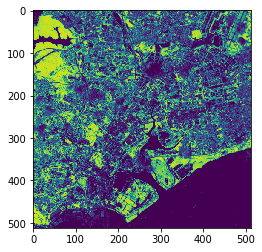

Model prediction


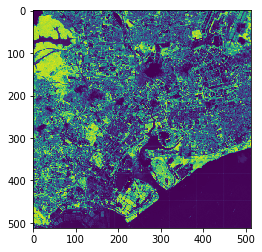

ToA NDVI


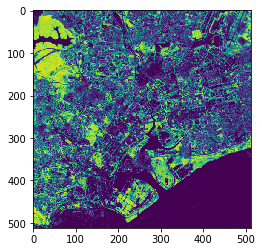

16
Real image


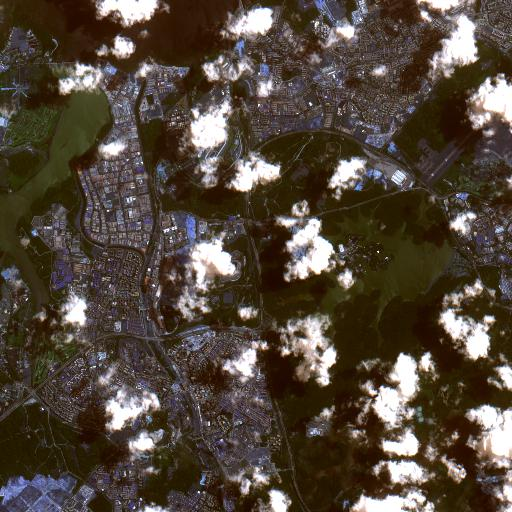

Real NDVI


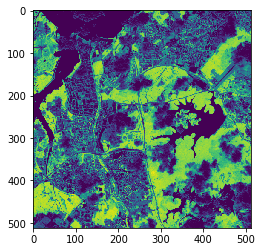

Model prediction


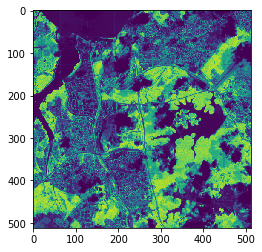

ToA NDVI


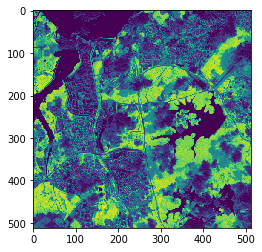

17
Real image


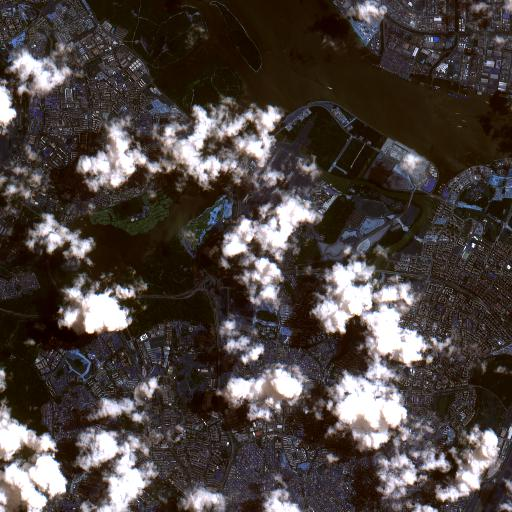

Real NDVI


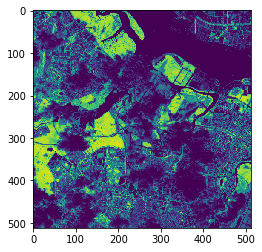

Model prediction


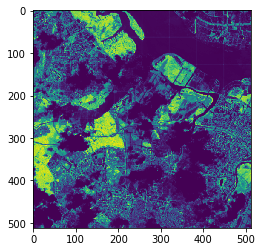

ToA NDVI


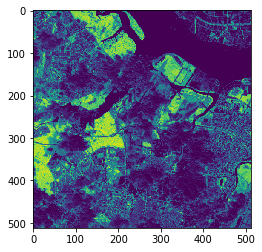

18
Real image


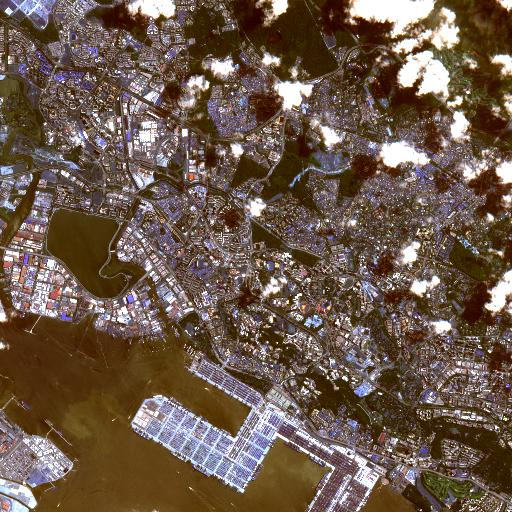

Real NDVI


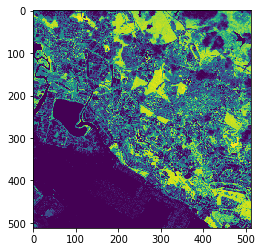

Model prediction


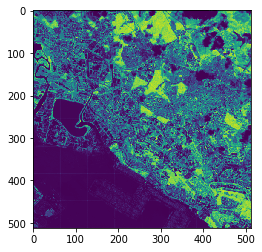

ToA NDVI


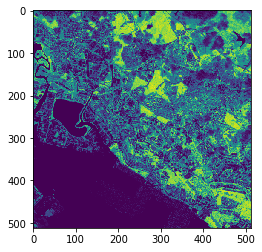

19
Real image


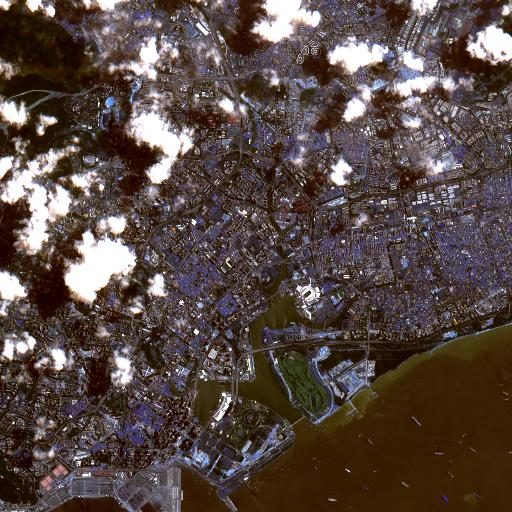

Real NDVI


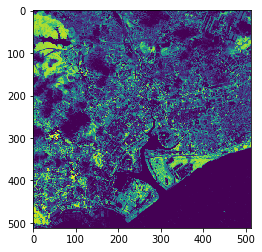

Model prediction


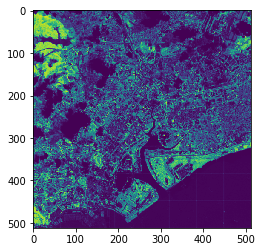

ToA NDVI


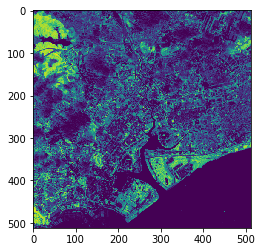

20
Real image


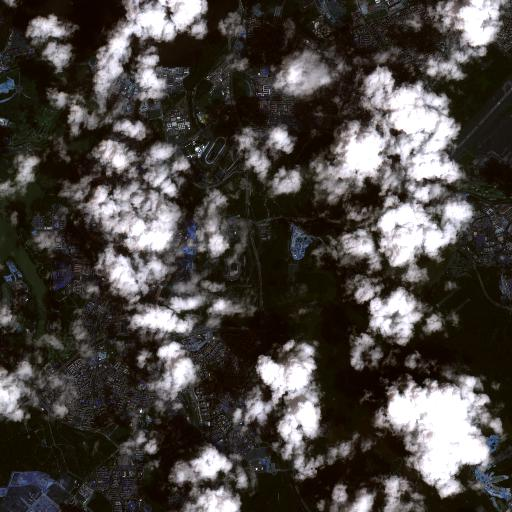

Real NDVI


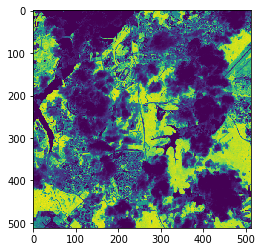

Model prediction


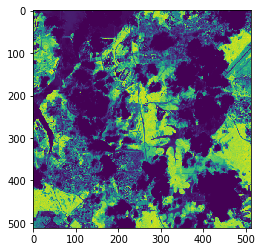

ToA NDVI


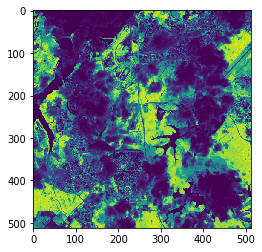

21
Real image


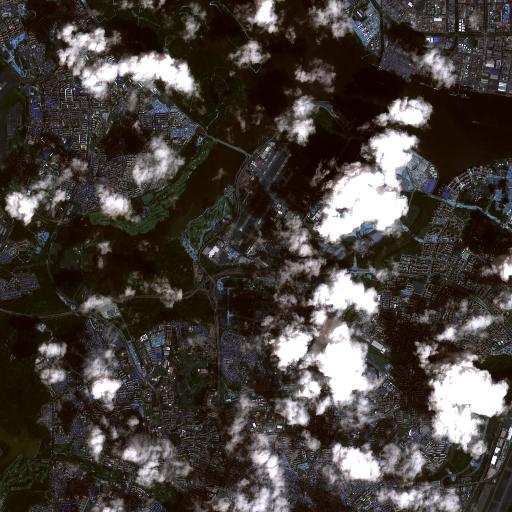

Real NDVI


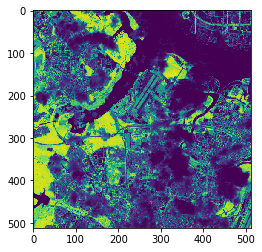

Model prediction


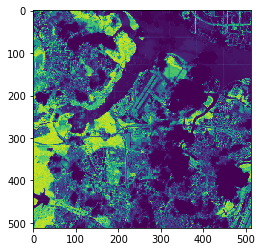

ToA NDVI


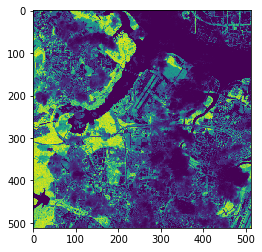

22
Real image


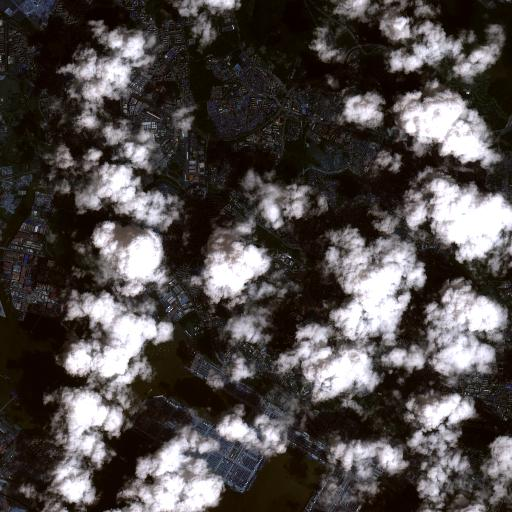

Real NDVI


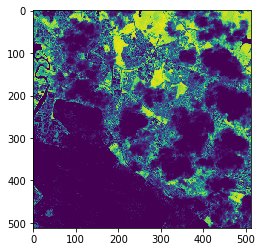

Model prediction


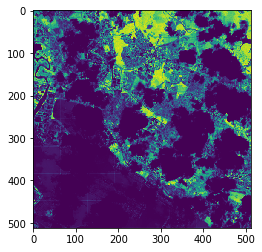

ToA NDVI


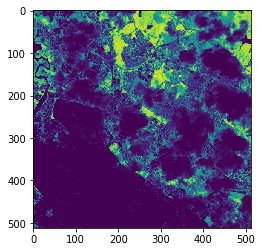

23
Real image


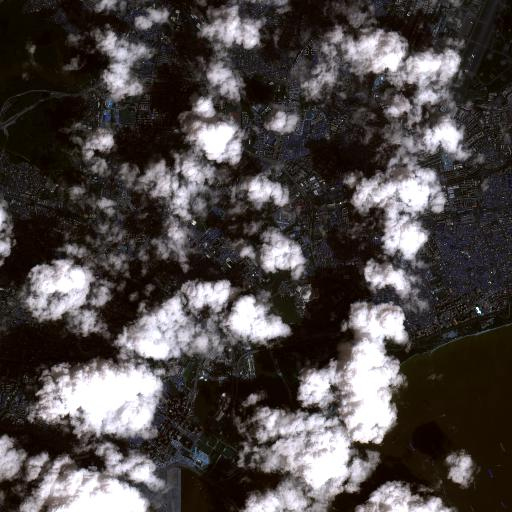

Real NDVI


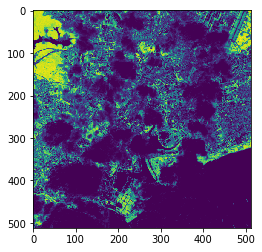

Model prediction


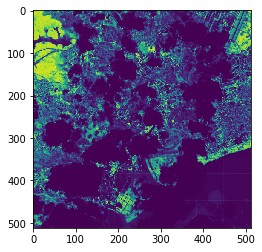

ToA NDVI


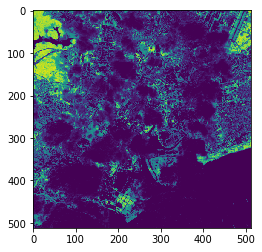

24
Real image


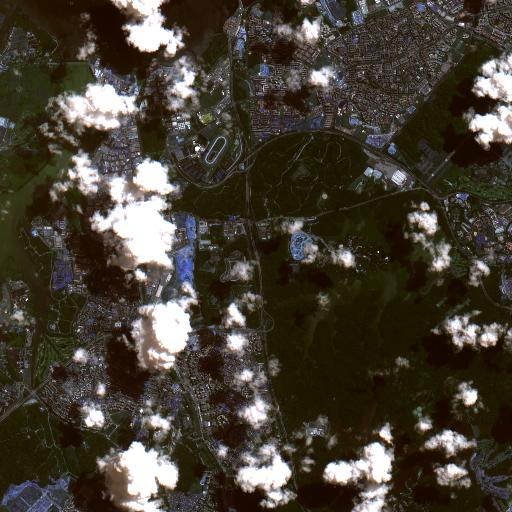

Real NDVI


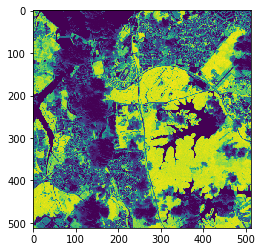

Model prediction


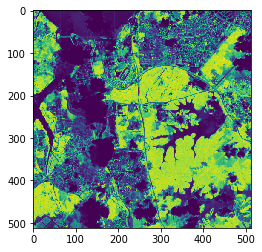

ToA NDVI


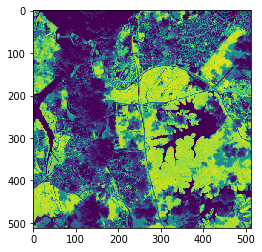

25
Real image


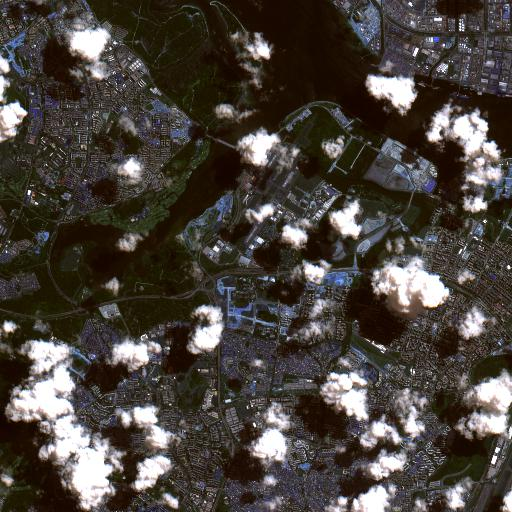

Real NDVI


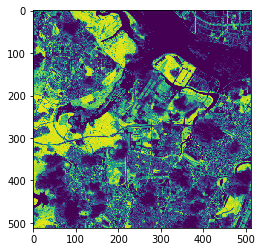

Model prediction


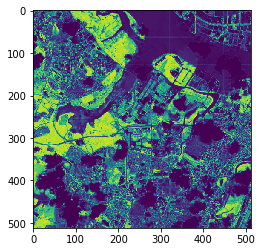

ToA NDVI


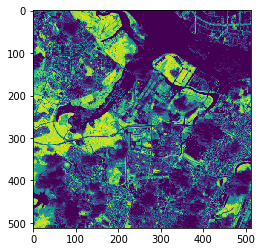

26
Real image


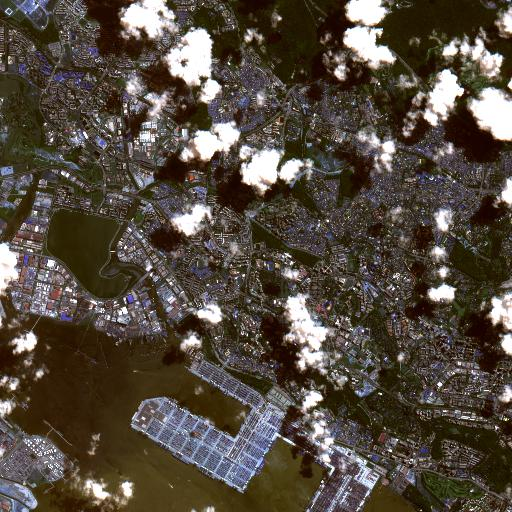

Real NDVI


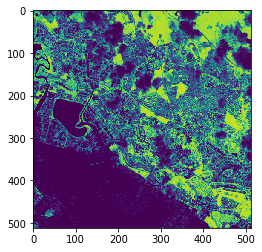

Model prediction


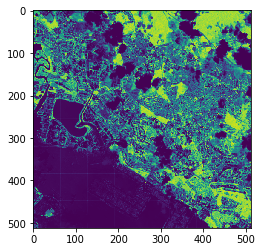

ToA NDVI


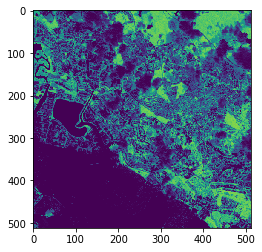

27
Real image


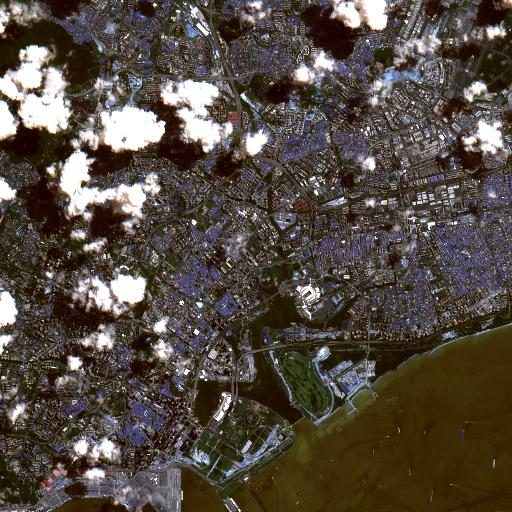

Real NDVI


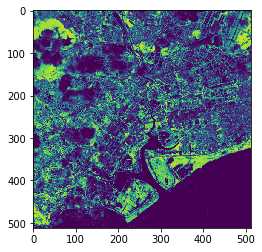

Model prediction


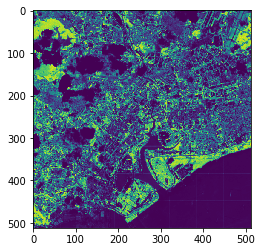

ToA NDVI


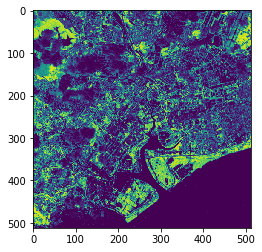

28
Real image


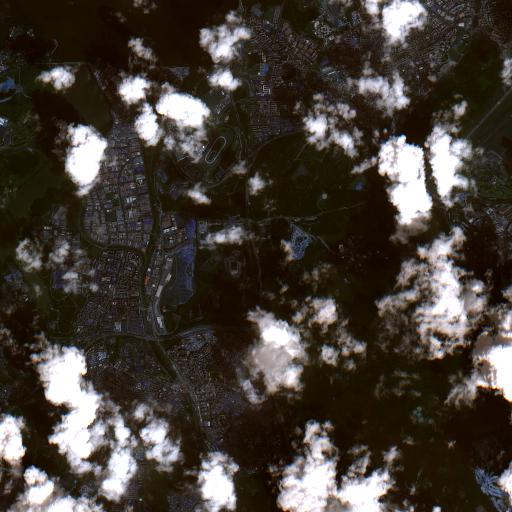

Real NDVI


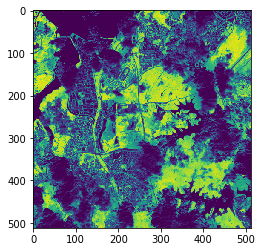

Model prediction


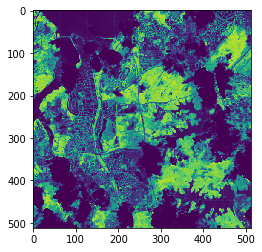

ToA NDVI


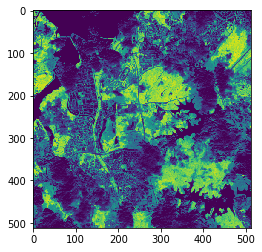

29
Real image


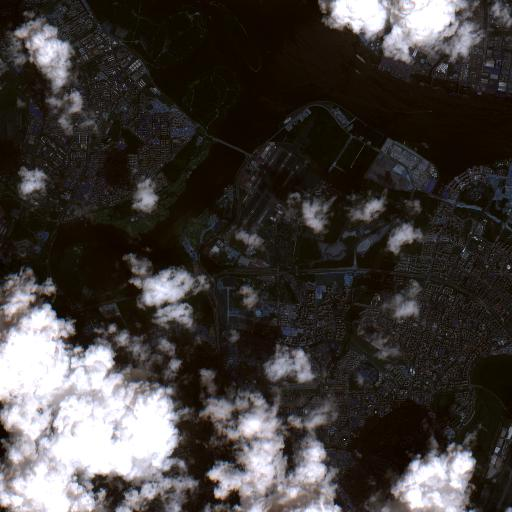

Real NDVI


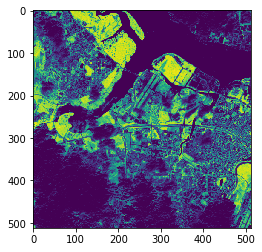

Model prediction


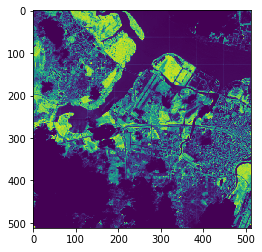

ToA NDVI


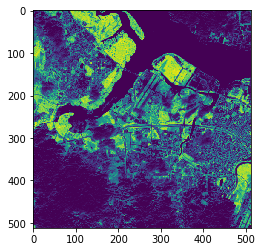

30
Real image


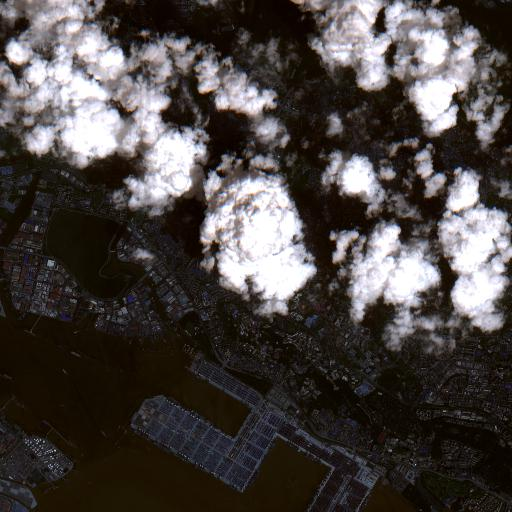

Real NDVI


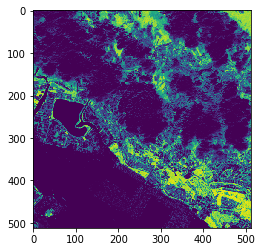

Model prediction


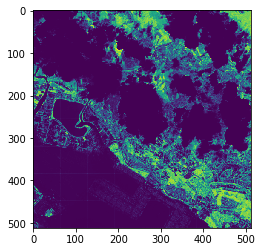

ToA NDVI


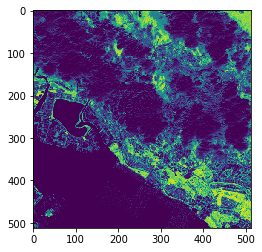

31
Real image


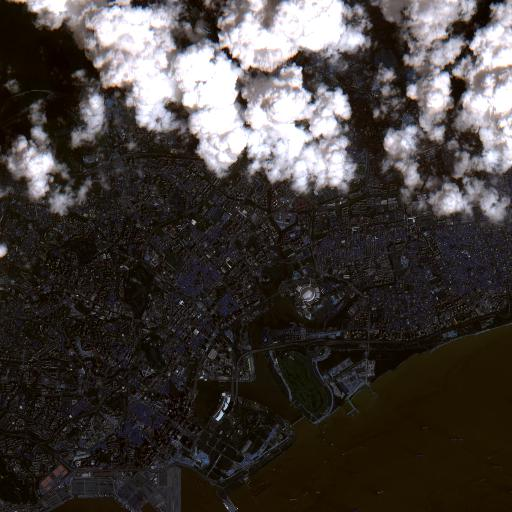

Real NDVI


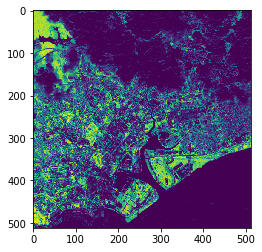

Model prediction


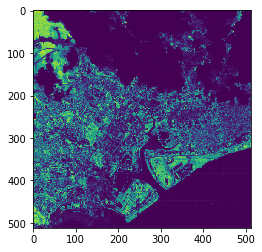

ToA NDVI


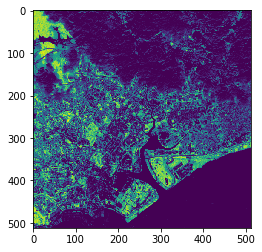

In [7]:
### Here we display a few images in singapore
for i in range(len(sg_ndvi)):
    print(i)
    print('Real image')
    display_color(features[i])
    plt.show()
    print('Real NDVI')
    plt.imshow(target[i,:,:,0])
    plt.show()
    print('Model prediction')
    plt.imshow(sg_ndvi[i,:,:])
    plt.show()
    print('ToA NDVI')
    plt.imshow(np.array(NDVI(features[i])))
    plt.show()

### Model for NDWI

In [8]:
### Create the dataset
data = {'features':np.array([img['feat_toa']/256 for img in train]),
        'target':np.array([img['ndwi'][:,:,np.newaxis] for img in train])}

### split in / out of sample
N = len(data['features'])
train_size = 0.8
is_rows = np.random.choice(list(range(N)),int(train_size*N),replace = False)
os_rows = np.setdiff1d(list(range(N)),is_rows)

in_sample = {'features':data['features'][is_rows],'target':data['target'][is_rows]}
out_sample = {'features':data['features'][os_rows],'target':data['target'][os_rows]}

ndwi_model = load_model('ndwi_model')
# ndwi_model.fit(in_sample['features'],out_sample['target'][:100],in_sample['target'],validation_data=(out_sample['features'],out_sample['target']),epochs=20)
# ndwi_model.save('ndwi_model')

(model's performance, ToA NDWI performance)
(0.00010349550063564261, 0.00012635600484462402)
Real NDWI


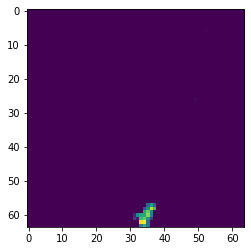

Predicted NDWI


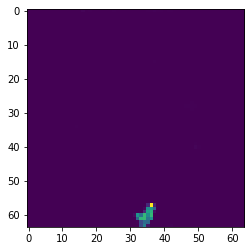

ToA NDWI


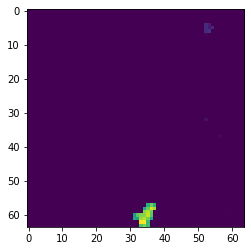

In [9]:
### Example of a picture. Here we worked on a dataset with very few water, which is why the model does not perform
### much better than the ToA approximation
print("(model's performance, ToA NDWI performance)")
print(model_score(ndwi_model,out_sample['features'],out_sample['target'],index_func=NDWI))
prediction = ndwi_model.predict(out_sample['features'])
index = 100
print('Real NDWI')
plt.imshow(out_sample['target'][index][:,:,0])
plt.show()
print('Predicted NDWI')
plt.imshow(prediction[index][:,:,0])
plt.show()
print('ToA NDWI')
plt.imshow(NDWI(out_sample['features'][index]))

## Data augmentation

We use data augmentation to make the model resilient for changes of contrast

In [10]:
augmented_data = {'features':np.array([img['feat_toa']/256 for img in train]+
                                      [0.5+0.3/256.*(img['feat_toa']-128) for img in train]+
                                      [0.5+0.5/256.*(img['feat_toa']-128) for img in train]+
                                      [0.5+0.7/256.*(img['feat_toa']-128) for img in train]),
        'target':np.array([img['ndvi'][:,:,np.newaxis] for img in train]+
                          [img['ndvi'][:,:,np.newaxis] for img in train]+
                          [img['ndvi'][:,:,np.newaxis] for img in train]+
                          [img['ndvi'][:,:,np.newaxis] for img in train]
                         )}
### split in / out of sample
N = len(augmented_data['features'])
train_size = 0.8
is_rows = np.random.choice(list(range(N)),int(train_size*N),replace = False)
os_rows = np.setdiff1d(list(range(N)),is_rows)

in_sample = {'features':augmented_data['features'][is_rows],'target':augmented_data['target'][is_rows]}
out_sample = {'features':augmented_data['features'][os_rows],'target':augmented_data['target'][os_rows]}

### load unet
u_net = load_model('unet')
# u_net.fit(in_sample['features'],out_sample['target'][:100],in_sample['target'],validation_data=(out_sample['features'],out_sample['target']),epochs=20)
# u_net.save('unet')

In [11]:
print("(model's performance, ToA NDVI performance)")
print(model_score(u_net,out_sample['features'],out_sample['target'],index_func=NDVI))

(model's performance, ToA NDVI performance)
(0.003473074007739063, 0.01618592578700974)


The U-Net performs way better, despite being tested on contrasted images